In [1]:
# import reqiuired packages
# conda install -c conda-forge geopandas
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import datetime 
pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings("ignore")
import geopandas as gpd
from shapely.geometry import Point, Polygon
from collections import Counter
import seaborn as sns
import geopy
import folium
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

In [2]:
# read the dataset
df = pd.read_excel('ANZdataset.xlsx')

In [3]:
# let's check the dataset 
df.head()

,status,card_present_flag,bpay_biller_code,account,currency,long_lat,txn_description,merchant_id,merchant_code,first_name,balance,date,gender,age,merchant_suburb,merchant_state,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement
0,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,NaN,Diana,35.39,2018-08-01,F,26,Ashmore,QLD,2018-08-01T01:01:15.000+0000,16.25,a623070bfead4541a6b0fff8a09e706c,Australia,CUS-2487424745,153.38 -27.99,debit
1,authorized,0.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,830a451c-316e-4a6a-bf25-e37caedca49e,NaN,Diana,21.20,2018-08-01,F,26,Sydney,NSW,2018-08-01T01:13:45.000+0000,14.19,13270a2a902145da9db4c951e04b51b9,Australia,CUS-2487424745,151.21 -33.87,debit
2,authorized,1.0,NaN,ACC-1222300524,AUD,151.23 -33.94,POS,835c231d-8cdf-4e96-859d-e9d571760cf0,NaN,Michael,5.71,2018-08-01,M,38,Sydney,NSW,2018-08-01T01:26:15.000+0000,6.42,feb79e7ecd7048a5a36ec889d1a94270,Australia,CUS-2142601169,151.21 -33.87,debit
3,authorized,1.0,NaN,ACC-1037050564,AUD,153.10 -27.66,SALES-POS,48514682-c78a-4a88-b0da-2d6302e64673,NaN,Rhonda,2117.22,2018-08-01,F,40,Buderim,QLD,2018-08-01T01:38:45.000+0000,40.90,2698170da3704fd981b15e64a006079e,Australia,CUS-1614226872,153.05 -26.68,debit
4,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,NaN,Diana,17.95,2018-08-01,F,26,Mermaid Beach,QLD,2018-08-01T01:51:15.000+0000,3.25,329adf79878c4cf0aeb4188b4691c266,Australia,CUS-2487424745,153.44 -28.06,debit


In [4]:
# how many rows and columns do we have
df.shape

(12043, 23)

In [5]:
# what are the column names
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12043 entries, 0 to 12042
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   status             12043 non-null  object        
 1   card_present_flag  7717 non-null   float64       
 2   bpay_biller_code   885 non-null    object        
 3   account            12043 non-null  object        
 4   currency           12043 non-null  object        
 5   long_lat           12043 non-null  object        
 6   txn_description    12043 non-null  object        
 7   merchant_id        7717 non-null   object        
 8   merchant_code      883 non-null    float64       
 9   first_name         12043 non-null  object        
 10  balance            12043 non-null  float64       
 11  date               12043 non-null  datetime64[ns]
 12  gender             12043 non-null  object        
 13  age                12043 non-null  int64         
 14  mercha

In [6]:
df['status'].value_counts()

authorized    7717
posted        4326
Name: status, dtype: int64

In [7]:
df['merchant_suburb'].value_counts()

Melbourne                      255
Sydney                         233
Southport                       82
Brisbane City                   79
Chatswood                       55
Perth                           45
Adelaide                        44
Mount Gambier                   41
Broadbeach                      41
Parramatta                      39
North Sydney                    37
Broken Hill                     36
Richmond                        35
Ringwood                        35
Darwin City                     35
Robina                          33
Nowra                           33
Ceduna                          33
Castlemaine                     33
Liverpool                       32
Brookvale                       32
Doncaster                       31
Docklands                       30
Mansfield                       30
Preston                         30
Albany                          29
Helensvale                      28
Alexandria                      28
Busselton           

In [8]:
len(df['merchant_suburb'].unique())

1610

In [9]:
for i in range(len(df)):
    df['merchant_suburb'][i] = str(df['merchant_suburb'][i]).capitalize()

In [10]:

df['card_present_flag'].value_counts()

1.0    6194
0.0    1523
Name: card_present_flag, dtype: int64

In [11]:
df['bpay_biller_code'].value_counts()

0                                        883
 LAND WATER & PLANNING East Melbourne      1
 THE DISCOUNT CHEMIST GROUP                1
Name: bpay_biller_code, dtype: int64

In [12]:
df.duplicated().sum()

0

In [13]:
# account numbers
df['account'].value_counts()

ACC-1598451071    578
ACC-1222300524    303
ACC-182446574     292
ACC-4258502723    260
ACC-1037050564    259
ACC-3485804958    245
ACC-2890243754    239
ACC-2673069055    239
ACC-1903037542    233
ACC-3481401842    230
ACC-3689607373    199
ACC-1710017148    178
ACC-958000567     174
ACC-2249586092    170
ACC-854938045     169
ACC-1799207998    166
ACC-3827517394    165
ACC-1516130869    163
ACC-1496451953    163
ACC-3541460373    155
ACC-966140392     152
ACC-3879258709    151
ACC-3100725361    148
ACC-37709441      145
ACC-1349834573    144
ACC-3771436525    141
ACC-1334819143    139
ACC-354106658     139
ACC-1443681913    137
ACC-2776252858    134
ACC-240804743     134
ACC-1608363396    129
ACC-2173390920    126
ACC-90814749      124
ACC-414431115     124
ACC-1990648130    124
ACC-2901672282    123
ACC-1683215619    122
ACC-3536132544    121
ACC-1652235822    118
ACC-3233697971    118
ACC-964839203     118
ACC-2681137560    118
ACC-819621312     117
ACC-588564840     116
ACC-308446

In [14]:
df['first_name'].value_counts()

Michael        746
Diana          578
Jessica        408
Joseph         391
Jeffrey        388
Richard        364
Kimberly       343
Tonya          292
Susan          282
Christopher    263
Rhonda         259
Ryan           239
Tiffany        230
Tyler          218
Kenneth        214
Robert         207
Virginia       199
Linda          179
Michelle       178
Sandra         174
Edward         170
James          169
Craig          165
Ricky          163
Natasha        151
Ronald         148
Charles        145
Matthew        144
Derek          141
Christine      139
Kristin        134
Luis           126
Kaitlyn        124
Amy            124
Daniel         123
Barry          122
Heather        121
Nathaniel      118
Robin          118
Renee          118
Michele        117
Isaiah         116
Antonio        115
Ruth           110
Scott          109
Mackenzie      102
Abigail        102
Lucas          100
Debra           98
Lori            97
Fernando        97
Eric            96
Jacqueline  

In [15]:
df['long_lat'].value_counts()

153.41 -27.95     578
151.23 -33.94     303
116.06 -32.00     292
145.45 -37.74     260
153.10 -27.66     259
138.52 -35.01     245
152.99 -27.49     239
153.32 -27.93     239
153.05 -27.61     233
115.74 -31.72     230
115.79 -31.79     199
150.82 -34.01     178
130.90 -12.37     174
115.98 -32.07     170
147.63 -22.84     169
150.68 -33.79     166
151.12 -33.89     165
130.84 -12.45     163
145.16 -37.84     163
145.00 -37.83     155
147.08 -37.97     152
143.83 -37.66     151
145.73 -17.03     148
153.41 -28.01     145
145.17 -37.84     144
145.04 -37.92     141
145.13 -37.70     139
151.04 -33.80     139
150.92 -33.77     137
121.48 -30.75     134
144.95 -37.76     134
151.22 -33.87     129
144.71 -37.58     126
151.68 -32.98     124
114.62 -28.80     124
142.77 -37.06     124
255.00 -573.00    123
138.67 -34.86     122
144.93 -37.79     121
151.04 -33.77     118
146.92 -36.07     118
144.89 -37.81     118
151.11 -33.99     118
145.04 -37.85     117
151.27 -33.76     116
144.79 -37

In [16]:
df['txn_description'].unique()

array(['POS', 'SALES-POS', 'PAYMENT', 'INTER BANK', 'PAY/SALARY',
       'PHONE BANK'], dtype=object)

In [17]:
df['merchant_code'].value_counts()

0.0    883
Name: merchant_code, dtype: int64

In [18]:
df['movement'].value_counts()

debit     11160
credit      883
Name: movement, dtype: int64

In [19]:
df.describe()

,card_present_flag,merchant_code,balance,age,amount
count,7717.000000,883.0,12043.000000,12043.000000,12043.000000
mean,0.802644,0.0,14704.195553,30.582330,187.933588
std,0.398029,0.0,31503.722652,10.046343,592.599934
min,0.000000,0.0,0.240000,18.000000,0.100000
25%,1.000000,0.0,3158.585000,22.000000,16.000000
50%,1.000000,0.0,6432.010000,28.000000,29.000000
75%,1.000000,0.0,12465.945000,38.000000,53.655000
max,1.000000,0.0,267128.520000,78.000000,8835.980000


In [20]:
print('Mean age is ' + str(df['age'].mean()))
print('Median age is ' + str(df['age'].median()))
print('Standard deviation for age is ' + str(df['age'].std()))



Mean age is 30.5823299842232
Median age is 28.0
Standard deviation for age is 10.046343038910601


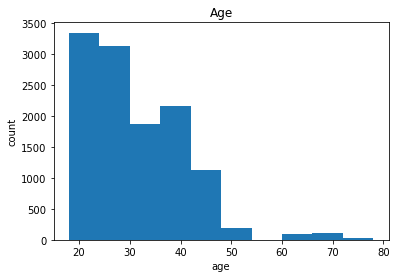

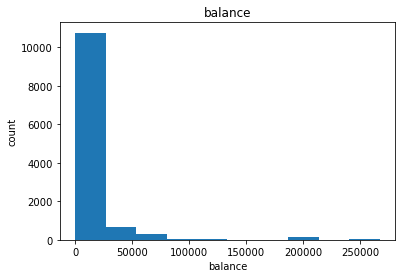

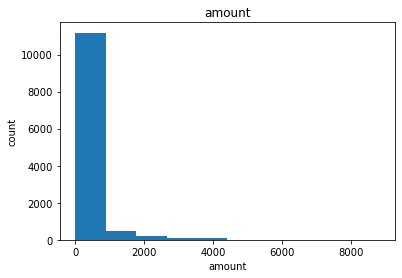

In [21]:
plt.hist(df['age'])
plt.xlabel('age')
plt.ylabel('count')
plt.title('Age')
plt.show()

plt.hist(df['balance'])
plt.xlabel('balance')
plt.ylabel('count')
plt.title('balance')
plt.show()

plt.hist(df['amount'])
plt.xlabel('amount')
plt.ylabel('count')
plt.title('amount')
plt.show()

In [22]:
df.isnull().sum()

status                   0
card_present_flag     4326
bpay_biller_code     11158
account                  0
currency                 0
long_lat                 0
txn_description          0
merchant_id           4326
merchant_code        11160
first_name               0
balance                  0
date                     0
gender                   0
age                      0
merchant_suburb          0
merchant_state        4326
extraction               0
amount                   0
transaction_id           0
country                  0
customer_id              0
merchant_long_lat     4326
movement                 0
dtype: int64

In [23]:
df.groupby('gender')['age', 'amount', 'balance'].mean()

,age,amount,balance
gender,,,
F,30.460750,168.517303,12061.260431
M,30.693715,205.721809,17125.519410


In [24]:
df.groupby(['merchant_state'])['age', 'amount', 'balance'].mean()

,age,amount,balance
merchant_state,,,
ACT,30.506849,66.803836,12489.304384
NSW,29.841402,47.036316,9448.416763
NT,27.097561,44.726293,5542.410195
QLD,29.913882,34.372397,7092.003541
SA,30.891566,40.425470,11150.330096
TAS,34.205882,28.866618,11431.072941
VIC,32.043172,41.099953,19653.248109
WA,26.752727,30.901873,9769.532018


In [25]:
df.groupby(['txn_description'])['age', 'amount', 'balance'].mean()


,age,amount,balance
txn_description,,,
INTER BANK,30.991914,86.699461,23823.345997
PAY/SALARY,32.631937,1898.728029,16242.859049
PAYMENT,31.265000,77.613077,19093.423212
PHONE BANK,32.594059,106.099010,37736.789703
POS,30.084325,40.407412,11870.974148
SALES-POS,30.021098,39.909789,11871.135859


In [26]:
df[['age', 'amount', 'balance']].corr()

,age,amount,balance
age,1.000000,0.029980,0.199329
amount,0.029980,1.000000,0.059178
balance,0.199329,0.059178,1.000000


<AxesSubplot:>

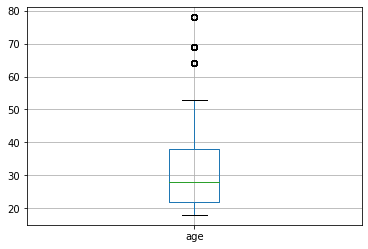

In [27]:
df.boxplot('age')

<AxesSubplot:>

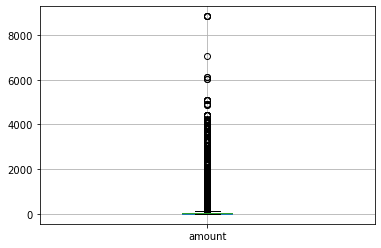

In [28]:
df.boxplot('amount')

<AxesSubplot:>

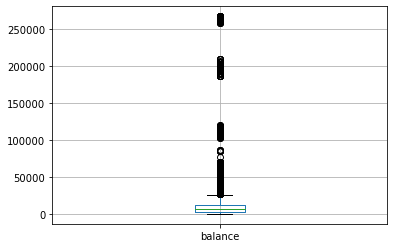

In [29]:
df.boxplot('balance')

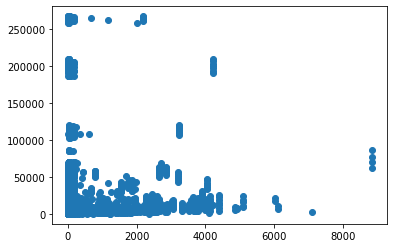

In [30]:
plt.scatter(df['amount'], df['balance'])
plt.show()

In [31]:
df.insert(12, 'time_in_day', 0)
df.insert(12, 'time', 0)

In [32]:

for i in range(len(df)) :
    df['time'][i] = df['extraction'][i][:19]
    
#for i in bad_chars :
#    test_string = test_string.replace(i, '')

In [33]:
# Following two code blocks are for removing the outliers. However, it may not be convinient 
#to remove outliers at this point
'''def remove_outlier(col):
    sorted(col)
    q1, q3 = col.quantile([0.25, 0.75])
    iqr = q3 - q1
    lower_range = q1 - (1.5 * iqr)
    upper_range = q3 + (1.5 * iqr)
    return lower_range, upper_range'''

'def remove_outlier(col):\n    sorted(col)\n    q1, q3 = col.quantile([0.25, 0.75])\n    iqr = q3 - q1\n    lower_range = q1 - (1.5 * iqr)\n    upper_range = q3 + (1.5 * iqr)\n    return lower_range, upper_range'

In [34]:
'''low_age, high_age = remove_outlier(df['age'])
df['age'] = np.where(df['age'] > high_age, high_age, df['age'])
df['age'] = np.where(df['age'] < low_age, low_age, df['age'])'''

"low_age, high_age = remove_outlier(df['age'])\ndf['age'] = np.where(df['age'] > high_age, high_age, df['age'])\ndf['age'] = np.where(df['age'] < low_age, low_age, df['age'])"

In [35]:
'''df.boxplot('age')'''

"df.boxplot('age')"

In [36]:
'''low_amount, high_amount = remove_outlier(df['amount'])
df['amount'] = np.where(df['amount'] > high_amount, high_amount, df['amount'])
df['amount'] = np.where(df['amount'] < low_amount, low_amount, df['amount'])'''

"low_amount, high_amount = remove_outlier(df['amount'])\ndf['amount'] = np.where(df['amount'] > high_amount, high_amount, df['amount'])\ndf['amount'] = np.where(df['amount'] < low_amount, low_amount, df['amount'])"

In [37]:
'''df.boxplot('amount')'''

"df.boxplot('amount')"

In [38]:
'''low_balance, high_balance = remove_outlier(df['balance'])
df['balance'] = np.where(df['balance'] > high_balance, high_balance, df['balance'])
df['balance'] = np.where(df['balance'] < low_balance, low_balance, df['balance'])'''

"low_balance, high_balance = remove_outlier(df['balance'])\ndf['balance'] = np.where(df['balance'] > high_balance, high_balance, df['balance'])\ndf['balance'] = np.where(df['balance'] < low_balance, low_balance, df['balance'])"

In [39]:
'''df.boxplot('balance')'''

"df.boxplot('balance')"

In [40]:
for i in range(len(df)):
    df['time'][i] = datetime.datetime.strptime(str(df['time'][i]), '%Y-%m-%dt%H:%M:%S')

In [41]:
'''plt.hist(df['age'])
plt.xlabel('age')
plt.ylabel('count')
plt.title('Age')
plt.show()

plt.hist(df['balance'])
plt.xlabel('balance')
plt.ylabel('count')
plt.title('balance')
plt.show()

plt.hist(df['amount'])
plt.xlabel('amount')
plt.ylabel('count')
plt.title('amount')
plt.show()'''

"plt.hist(df['age'])\nplt.xlabel('age')\nplt.ylabel('count')\nplt.title('Age')\nplt.show()\n\nplt.hist(df['balance'])\nplt.xlabel('balance')\nplt.ylabel('count')\nplt.title('balance')\nplt.show()\n\nplt.hist(df['amount'])\nplt.xlabel('amount')\nplt.ylabel('count')\nplt.title('amount')\nplt.show()"

In [42]:
'''for i in range(len(df)):
    df.groupby(df['time'][i].hour).value_col.sum()'''

df.resample('d', on='time').amount.sum()


time
2018-08-01    29867.94
2018-08-02    21786.32
2018-08-03    38096.58
2018-08-04     6296.05
2018-08-05     4426.50
2018-08-06    42288.23
2018-08-07    35623.04
2018-08-08    22553.11
2018-08-09    28866.80
2018-08-10    30754.36
2018-08-11     6930.93
2018-08-12     4397.12
2018-08-13    31430.07
2018-08-14    21682.06
2018-08-15    34975.44
2018-08-16        0.00
2018-08-17    41906.21
2018-08-18     7778.45
2018-08-19     4778.92
2018-08-20    48240.34
2018-08-21    23972.31
2018-08-22    23559.60
2018-08-23    34763.05
2018-08-24    34603.11
2018-08-25     5204.79
2018-08-26     4268.99
2018-08-27    32159.28
2018-08-28    22689.01
2018-08-29    28933.77
2018-08-30    20814.53
2018-08-31    36288.61
2018-09-01     6860.89
2018-09-02     5198.17
2018-09-03    40747.80
2018-09-04    26577.69
2018-09-05    24775.07
2018-09-06    35799.17
2018-09-07    38365.27
2018-09-08     7707.51
2018-09-09     7988.83
2018-09-10    33489.42
2018-09-11    21491.51
2018-09-12    34741.30
2018-0

In [43]:
for i in range(len(df)):
    if 3 <= df['time'][i].hour <= 5:
        df['time_in_day'][i] = 'Early morning'
    if 5 < df['time'][i].hour < 11:
        df['time_in_day'][i] = 'Morning'
    if 11 <= df['time'][i].hour <= 15: 
        df['time_in_day'][i] = 'Around noon'
    if 15 < df['time'][i].hour < 18:
        df['time_in_day'][i] = 'Afternoon'
    if 18 <= df['time'][i].hour <= 22: 
        df['time_in_day'][i] = 'Evening'     
    if 22 < df['time'][i].hour:
        df['time_in_day'][i] = 'Night'
    if df['time'][i].hour <= 3:
        df['time_in_day'][i] = 'Late night'


In [44]:
df.groupby('time_in_day')['age'].median()

time_in_day
Afternoon        28
Around noon      28
Early morning    30
Evening          27
Late night       27
Morning          27
Night            29
Name: age, dtype: int64

In [45]:
df.groupby('time_in_day')['age'].mean()

time_in_day
Afternoon        30.867769
Around noon      30.616671
Early morning    31.774131
Evening          30.480938
Late night       29.987671
Morning          30.358246
Night            31.089202
Name: age, dtype: float64

In [46]:
k =pd.DataFrame(df.groupby('time_in_day')['amount'].sum())
k['time'] = k.index
k.amount


time_in_day
Afternoon         653040.02
Around noon      1237533.83
Early morning      32427.92
Evening           135326.81
Late night         46042.47
Morning           137334.83
Night              21578.32
Name: amount, dtype: float64

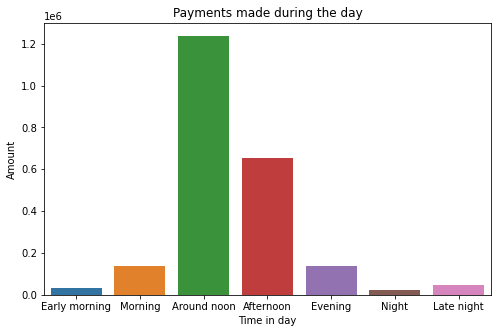

In [47]:
order = ["Early morning", "Morning", "Around noon", "Afternoon", "Evening", "Night", "Late night"]
plt.figure(figsize=(8,5))
ax = sns.barplot(x="time", y="amount", data=k, estimator=sum, order = order)
plt.xlabel("Time in day")
plt.ylabel("Amount")
plt.title('Payments made during the day')
plt.show()



In [48]:
df.merchant_long_lat.fillna(df.long_lat, inplace=True)
    
'''    df['merchant_long_lat'][i] = df['merchant_long_lat'][i].replace(np.nan, str(df['long_lat'][i]))

    if df['merchant_long_lat'][i] == np.nan:
        df['merchant_long_lat'][i] = df['long_lat'][i]'''

"    df['merchant_long_lat'][i] = df['merchant_long_lat'][i].replace(np.nan, str(df['long_lat'][i]))\n\n    if df['merchant_long_lat'][i] == np.nan:\n        df['merchant_long_lat'][i] = df['long_lat'][i]"

In [49]:
df.insert(25, 'day', 0)
df.insert(26, 'month', 'jan')

In [50]:
for i in range(len(df)): 
    df['day'][i] = df['time'][i].day
    df['month'][i] = df['time'][i].month


In [51]:
for i in range(len(df)):
    if df['month'][i] == 8:
        df['month'][i] = 'August'
    if df['month'][i] == 9:
        df['month'][i] = 'September'
    if df['month'][i] == 10:
        df['month'][i] = 'October'

<Figure size 216x360 with 0 Axes>

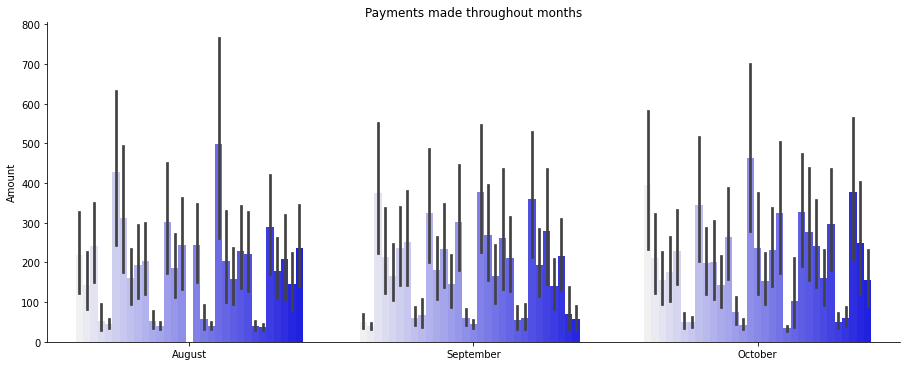

In [52]:
plt.figure(figsize=(3,5))
ax.set(xlabel='common xlabel', ylabel='common ylabel')
ax = sns.catplot(kind='bar', x='month', y='amount', hue='day', data=df, color='b', legend=False, height=5, aspect=30/12)
plt.xlabel("")
plt.ylabel("Amount")
plt.title('Payments made throughout months')
plt.show()


In [53]:
df.insert(23, 'longitude', 0)
df.insert(24, 'latitude', 0)
df.insert(26, 'geometry', 0)

In [54]:
for i in range(12043):
    df['longitude'][i] = float(str(df['long_lat'][i]).split(' ')[0])
    df['latitude'][i] = float(str(df['long_lat'][i]).split(' ')[1])


In [55]:
for i in range(len(df)):
    if df['latitude'][i] < -90:
        df['latitude'][i] = float(str(df['merchant_long_lat'][i]).split(' ')[1])
    if df['longitude'][i] < -90:
        df['longitude'][i] = float(str(df['merchant_long_lat'][i]).split(' ')[0])

In [56]:
df = df[(df['longitude'] >= -180)] 
df = df[(df['longitude'] <= 180)] 
df = df[(df['latitude'] >= -90)]  

In [57]:
str(df['merchant_long_lat'][120]).split(' ')

['146.94', '-36.04']

In [58]:
df = df[(df['longitude'] <= 180)] 

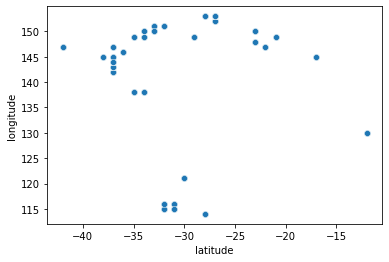

In [59]:
sns.scatterplot(df['latitude'], df['longitude'])
plt.show()

In [60]:
map_pickup = folium.Map( location=[-23.455641, 132.626273])
df.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude"]] ).add_to(map_pickup), axis=1)
sw = [-39.412816, 118.563773]
ne = [-16.270002, 151.610647]
map_pickup.fit_bounds([sw, ne]) 
map_pickup